### Library import

In [ ]:
# Importing required libraries
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
from skimage.io import imread
from keras.utils import plot_model
import os
import glob
import imageio

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Data Loading

In [ ]:
# Declaring the data path
tr1_dir = './drive/MyDrive/Style_Transfer/Tr1/TrainT1/'
tr2_dir = './drive/MyDrive/Style_Transfer/Tr2/TrainT2/'

In [ ]:
# Function to load the image data
def load_data(dir: str):
    images_path = sorted([os.path.join(dir, x) for x in os.listdir(dir)])
    images = np.array([imread(x) for x in images_path])
    return images

In [ ]:
# Reading the entire dataset from the directory
type1_images = load_data(tr1_dir)
type2_images = load_data(tr2_dir)

### Data Visualization

In [ ]:
# Function to display random Type 1 & 2 images
def random_image_display():
    fig, ax = plt.subplots(1,2, figsize=(10,10))
    idx = np.random.randint(0, type1_images.shape[0])
    ax[0].imshow(type1_images[idx], cmap='gray')
    ax[0].set_title('Type 1')
    ax[0].axis('off')
    ax[1].imshow(type2_images[idx], cmap='gray')
    ax[1].set_title('Type 2')
    ax[1].axis('off')
    plt.show()

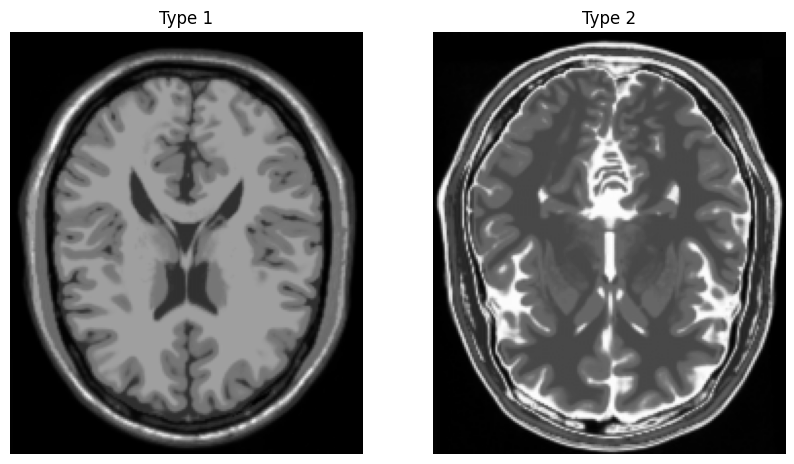

In [ ]:
# Displaying random Type 1 & 2 images
random_image_display()

### Data Preprocessing

In [ ]:
# Declaring the buffer and batch size
BUFFER = type1_images.shape[0]
BATCH_SIZE = 5

- Data Normalization

In [ ]:
# Normalizing the images
train_data = (type1_images/127.5) - 1
test_data = (type2_images/127.5) - 1

(217, 181)


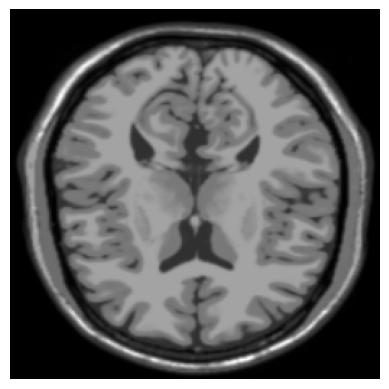

In [ ]:
# Displaying the normalized image
plt.imshow(resize(train_data[10], (256,256)), cmap='gray')
plt.axis('off')
plt.show()

- Data Resizing

In [ ]:
# Resizing the Type 1 images to size 256x256
type1_data = np.zeros((train_data.shape[0], 256, 256))
for idx, img in enumerate(train_data):
    type1_data[idx, :, :] = resize(img, (256, 256))
type1_data.shape

(43, 256, 256)

In [ ]:
# Resizing the Type 2 images to size 256x256
type2_data = np.zeros((test_data.shape[0], 256, 256))
for idx, img in enumerate(test_data):
    type2_data[idx, :, :] = resize(img, (256, 256))
type2_data.shape

(46, 256, 256)

- Data Reshaping and Shuffling

In [ ]:
# Reshaping type 1 & 2 images from 256x256 to 256x256x1 (Adding a channel dimension to the images)
type1_data = type1_data.reshape(type1_data.shape[0], 256, 256, 1).astype('float32')
type2_data = type2_data.reshape(type2_data.shape[0], 256, 256, 1).astype('float32')

In [ ]:
# Shuffling the image dataset
type1_data = tf.data.Dataset.from_tensor_slices(type1_data).shuffle(BUFFER, seed=42).batch(BATCH_SIZE)
type2_data = tf.data.Dataset.from_tensor_slices(type2_data).shuffle(BUFFER, seed=42).batch(BATCH_SIZE)

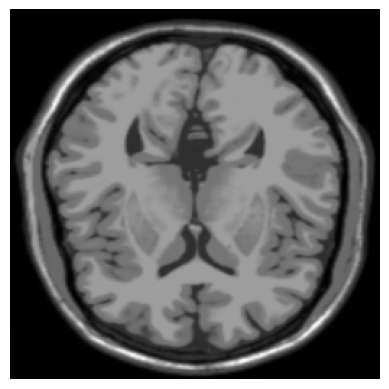

In [ ]:
# Displaying random type1 image from the generator created above
type1_sample_image = next(iter(type1_data))
plt.imshow(type1_sample_image[0].numpy()[:,:,0], cmap='gray')
plt.axis('off')
plt.show()

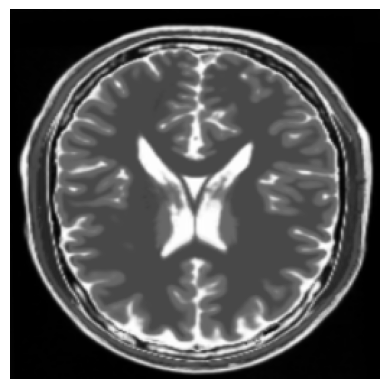

In [ ]:
# Displaying random type2 image from the generator created above
type2_sample_image = next(iter(type2_data))
plt.imshow(type2_sample_image[0].numpy()[:,:,0], cmap='gray')
plt.axis('off')
plt.show()

### Model Building

- Instance normalization

In [ ]:
# Defining Instance Normalization class to apply normalization layer in the CycleGAN architecture
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(name='scale', shape=input_shape[-1:], initializer=tf.random_normal_initializer(1, 0.03), trainable=True)
        self.offset = self.add_weight(name='offset', shape=input_shape[-1:], initializer='zeros', trainable=True)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

- Down Sampling

In [ ]:
# Function defenition for down-sample in U-net architecture
def down_sample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    if apply_norm:
        model.add(InstanceNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    return model

- Up Sampling

In [ ]:
# Function defenition for up-sample in U-net architecture
def up_sample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    if apply_dropout:
        model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.ReLU())
    return model

- U-net Generator

In [ ]:
# Defining the U-net architecture with appropriate number of down-sample and up-sample layers for image of 256x256x1 dimension images
def unet_generator():
    down_sample_stack = [
        down_sample(64, 4, apply_norm=False), # (128, 128, 128)
        down_sample(128, 4), # (64, 64, 128)
        down_sample(128, 4), # (32, 32, 128)
        down_sample(128, 4), # (16, 16, 128)
        down_sample(128, 4), # (8, 8, 128)
        down_sample(128, 4), # (4, 4, 128)
        down_sample(128, 4), # (2, 2, 128)
        down_sample(128, 4)  # (1, 1, 128)
    ]

    up_sample_stack = [
        up_sample(128, 4, True), # (2, 2, 256)
        up_sample(128, 4),       # (4, 4, 256)
        up_sample(128, 4),       # (8, 8, 128)
        up_sample(128, 4),       # (16, 16, 64)
        up_sample(128, 4),       # (32, 32, 64)
        up_sample(128, 4),       # (64, 64, 64)
        up_sample(128, 4),       # (128, 128, 128)
        up_sample(64, 4)         # (256, 256, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh') # (256, 256, 1)
    concat = tf.keras.layers.Concatenate()
    inp = tf.keras.layers.Input(shape=[256, 256, 1])
    x = inp
    skips = []
    for down in down_sample_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    for up, skip in zip(up_sample_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inp, outputs=x)

- Generator

In [ ]:
# creating generators to generate images from the imput images
generator_g = unet_generator()
generator_f = unet_generator()

In [ ]:
# Generator G summary
generator_g.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 64  1024        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  131328      ['sequential[0][0]']             
                                                                                              

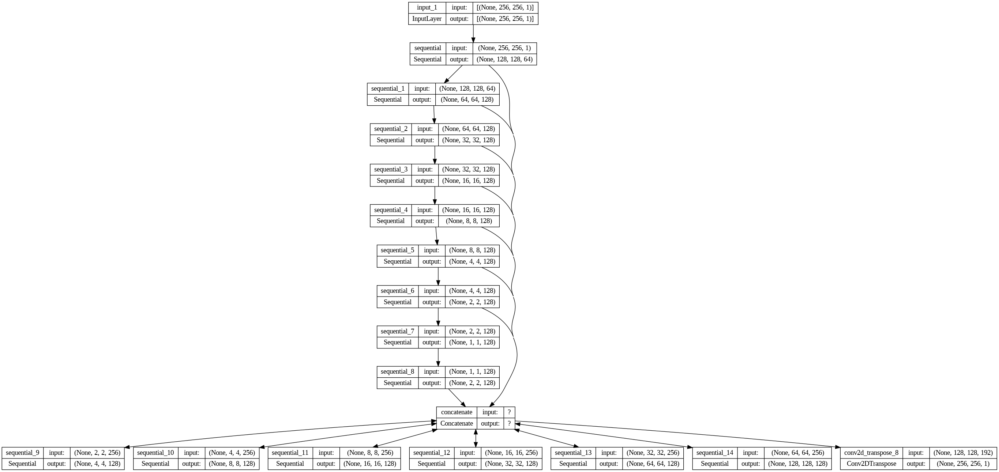

In [ ]:
# Generator G Final architecture
plot_model(generator_g, show_shapes=True)

- Discriminator

In [ ]:
# Discriminator architecture
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image') # (5, 256, 256, 1)
    x = inp

    down1 = down_sample(64, 4, False)(x) # (5, 128, 128, 64)
    down2 = down_sample(128, 4)(down1) # (5, 64, 64, 128)
    zero1 = tf.keras.layers.ZeroPadding2D()(down2) # (5, 66, 66, 128)
    conv = tf.keras.layers.Conv2D(256, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero1)  # (5, 63, 63, 256)
    norm = InstanceNormalization()(conv)
    activation = tf.keras.layers.LeakyReLU()(norm)

    zero2 = tf.keras.layers.ZeroPadding2D()(activation)  # (5, 65, 65, 256)
    out = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero2)  # (5, 62, 62, 1)
    return tf.keras.Model(inputs=inp, outputs=out)

In [ ]:
# Discriminator creation
discriminator_x = discriminator()
discriminator_y = discriminator()

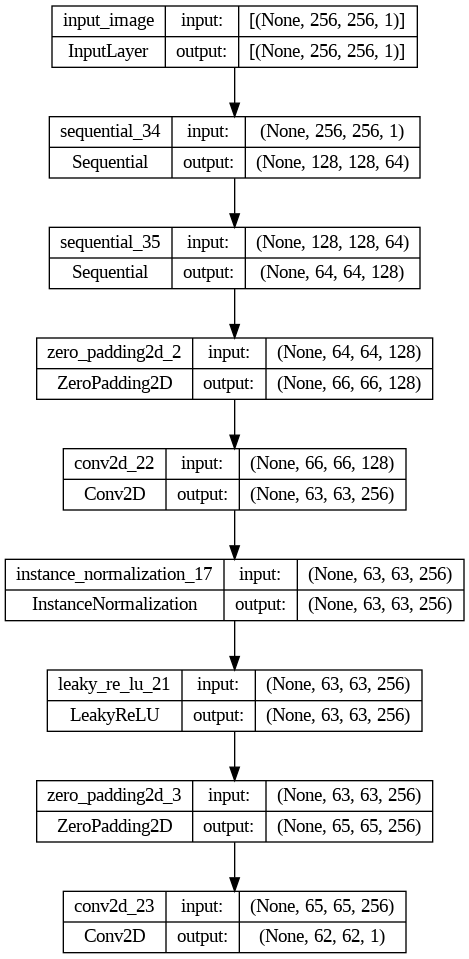

In [ ]:
# Final discriminator architecture
plot_model(discriminator_y, show_shapes=True)

In [ ]:
# Discriminator model summary
discriminator_y.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 1)]     0         
                                                                 
 sequential_34 (Sequential)  (None, 128, 128, 64)      1024      
                                                                 
 sequential_35 (Sequential)  (None, 64, 64, 128)       131328    
                                                                 
 zero_padding2d_2 (ZeroPaddi  (None, 66, 66, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 63, 63, 256)       524288    
                                                                 
 instance_normalization_17 (  (None, 63, 63, 256)      512       
 InstanceNormalization)                                    

### Model Training

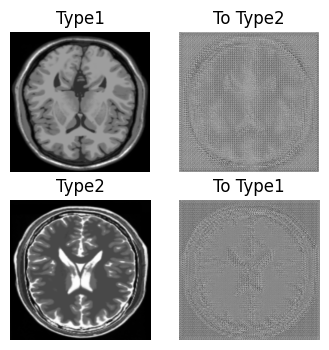

In [ ]:
# initial images (Noise) of the model
to_type2 = generator_g(type1_sample_image)
to_type1 = generator_f(type2_sample_image)

plt.figure(figsize=(4, 4))
images = [type1_sample_image, to_type2, type2_sample_image, to_type1]
labels = ['Type1', 'To Type2', 'Type2', 'To Type1']

for i in range(len(images)):
    plt.subplot(2, 2, i+1)
    plt.title(labels[i])
    plt.imshow(images[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

In [ ]:
# Loss (BCE) object definition
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

- Loss Functions

In [ ]:
# Generator Loss
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

# Discriminator Loss
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_loss = real_loss + generated_loss
    return total_loss * 0.5

# Cycle Loss
def cycle_consistency_loss(real_image, cycle_image):
    loss = tf.reduce_mean(tf.abs(real_image - cycle_image))
    return 10.0*loss

# Identity Loss
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5 * loss

- Optimizer

In [ ]:
# Optimizer defenition
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-5, beta_1=0.5)

In [ ]:
# Epoch defenition
EPOCHS = 100

In [ ]:
# Checkpoint defenition
checkpoint_dir = './training_checkpoints'

chk = tf.train.Checkpoint(generator_g=generator_g, generator_f=generator_f,
                          discriminator_x=discriminator_x, discriminator_y=discriminator_y,
                          generator_g_optimizer=generator_g_optimizer, generator_f_optimizer=generator_f_optimizer,
                          discriminator_x_optimizer=discriminator_x_optimizer, discriminator_y_optimizer=discriminator_y_optimizer)

chk_manager = tf.train.CheckpointManager(chk, checkpoint_dir, max_to_keep=5)

if chk_manager.latest_checkpoint:
    chk.restore(chk_manager.latest_checkpoint)
    print('Latest Checkpoint Restored from backup folder!!')

In [ ]:
# Function to plot the images generated during model training
def generated_image(model1, test_inp1, model2, test_inp2, epoch):
    pred1 = model1(test_inp1)
    pred2 = model2(test_inp2)
    plt.figure(figsize=(8, 4))
    disp = [test_inp1[0], pred1[0], test_inp2[0], pred2[0]]
    labels = ['Input Image', 'Prediction', 'Input Image', 'Prediction']
    for i in range(len(disp)):
        plt.subplot(1, 4, i+1)
        plt.imshow(disp[i].numpy()[:, :, 0], cmap='gray')
        plt.title(labels[i])
        plt.axis('off')
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

- Training Flow

In [ ]:
# Model training function defenition
@tf.function
def train_step(real_x, real_y):
    '''
    Generator G: X -> Y
    Generator F: Y -> X
    '''
    with tf.GradientTape(persistent=True) as tape:
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # Loss Calculation
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        total_cycle_loss = cycle_consistency_loss(real_x, cycled_x) + cycle_consistency_loss(real_y, cycled_y)
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_x, same_x)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_y, same_y)
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
    # Graient Calculation
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    # Apply gradients to optimizers
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))


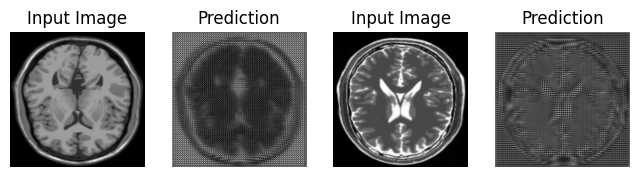

Checkpoint Saved at ./training_checkpoints/ckpt-1 for 1 EPOCH


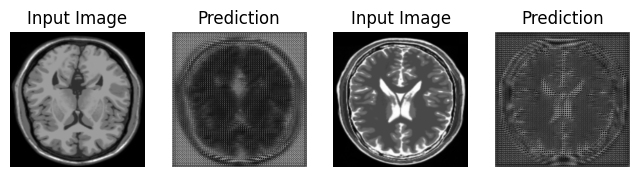

Checkpoint Saved at ./training_checkpoints/ckpt-2 for 2 EPOCH


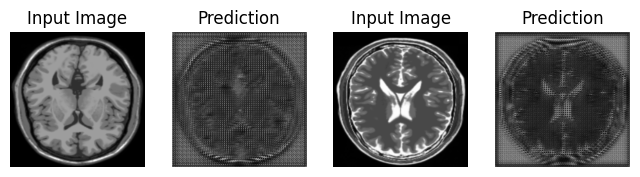

Checkpoint Saved at ./training_checkpoints/ckpt-3 for 3 EPOCH


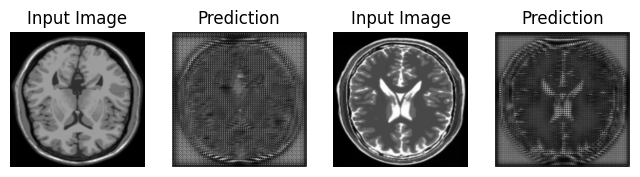

Checkpoint Saved at ./training_checkpoints/ckpt-4 for 4 EPOCH


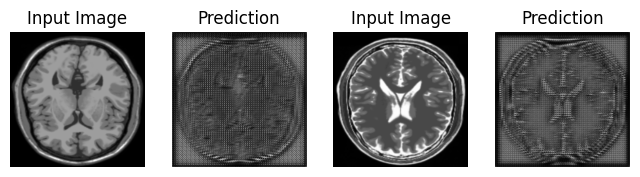

Checkpoint Saved at ./training_checkpoints/ckpt-5 for 5 EPOCH


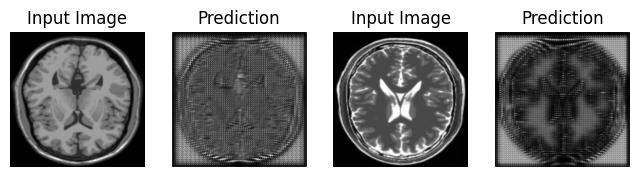

Checkpoint Saved at ./training_checkpoints/ckpt-6 for 6 EPOCH


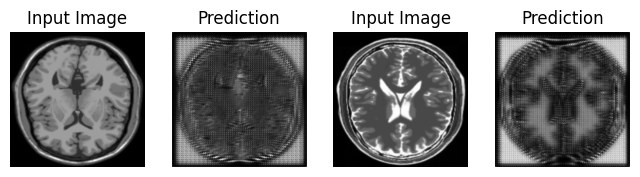

Checkpoint Saved at ./training_checkpoints/ckpt-7 for 7 EPOCH


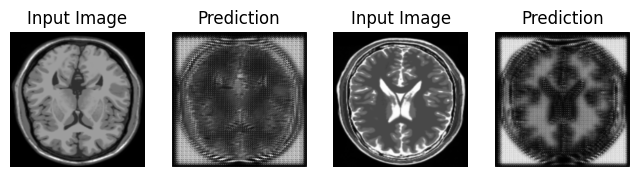

Checkpoint Saved at ./training_checkpoints/ckpt-8 for 8 EPOCH


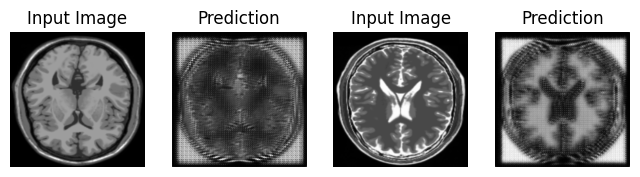

Checkpoint Saved at ./training_checkpoints/ckpt-9 for 9 EPOCH


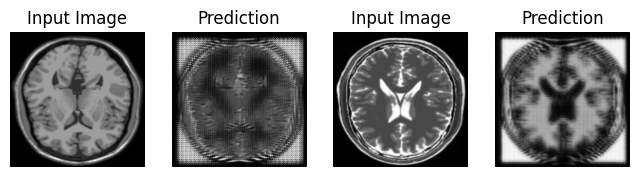

Checkpoint Saved at ./training_checkpoints/ckpt-10 for 10 EPOCH


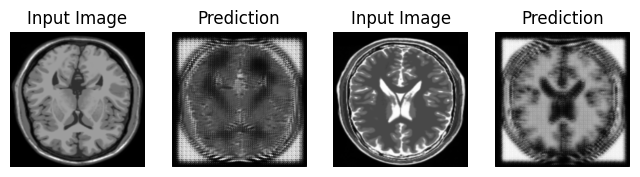

Checkpoint Saved at ./training_checkpoints/ckpt-11 for 11 EPOCH


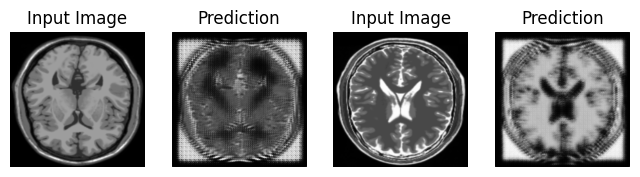

Checkpoint Saved at ./training_checkpoints/ckpt-12 for 12 EPOCH


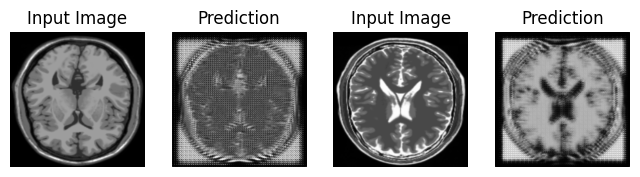

Checkpoint Saved at ./training_checkpoints/ckpt-13 for 13 EPOCH


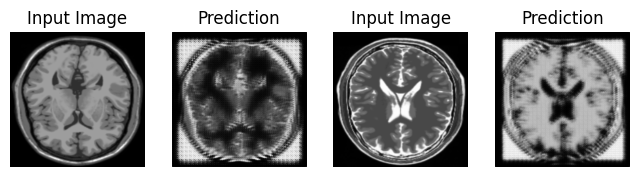

Checkpoint Saved at ./training_checkpoints/ckpt-14 for 14 EPOCH


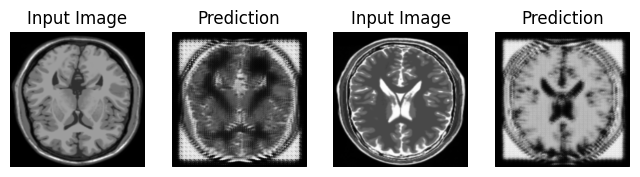

Checkpoint Saved at ./training_checkpoints/ckpt-15 for 15 EPOCH


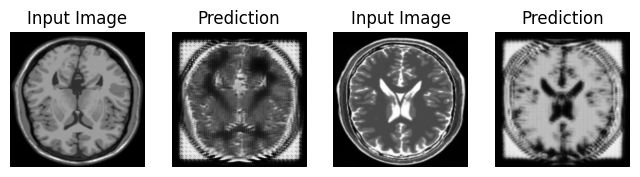

Checkpoint Saved at ./training_checkpoints/ckpt-16 for 16 EPOCH


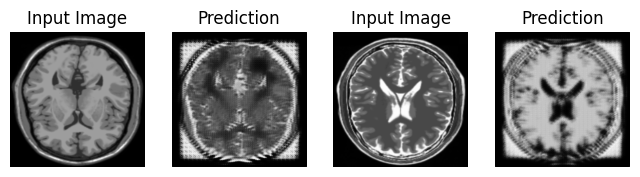

Checkpoint Saved at ./training_checkpoints/ckpt-17 for 17 EPOCH


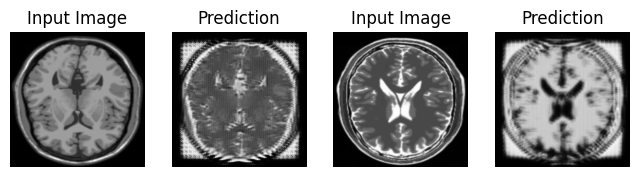

Checkpoint Saved at ./training_checkpoints/ckpt-18 for 18 EPOCH


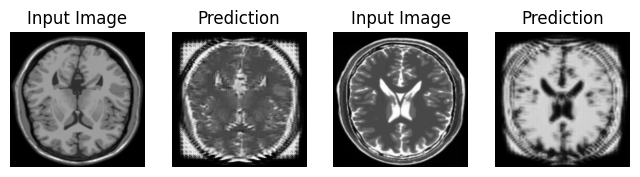

Checkpoint Saved at ./training_checkpoints/ckpt-19 for 19 EPOCH


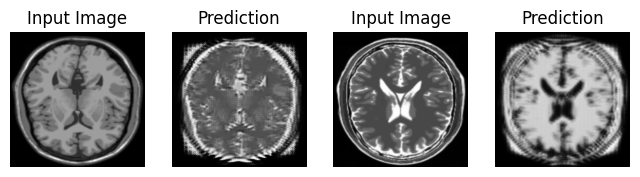

Checkpoint Saved at ./training_checkpoints/ckpt-20 for 20 EPOCH


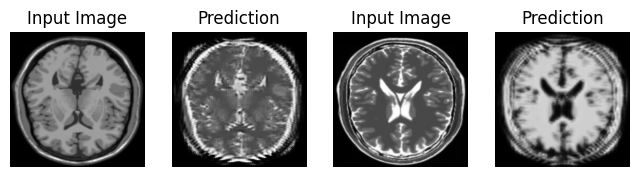

Checkpoint Saved at ./training_checkpoints/ckpt-21 for 21 EPOCH


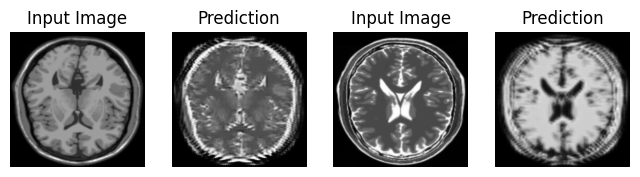

Checkpoint Saved at ./training_checkpoints/ckpt-22 for 22 EPOCH


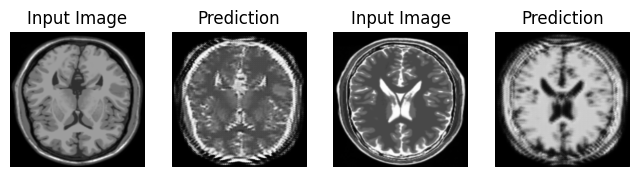

Checkpoint Saved at ./training_checkpoints/ckpt-23 for 23 EPOCH


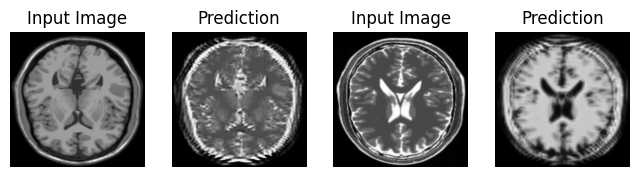

Checkpoint Saved at ./training_checkpoints/ckpt-24 for 24 EPOCH


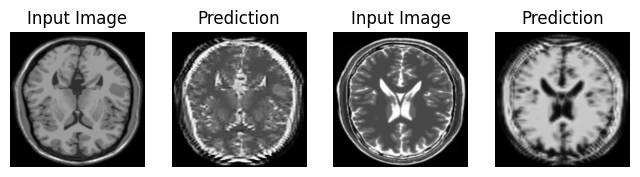

Checkpoint Saved at ./training_checkpoints/ckpt-25 for 25 EPOCH


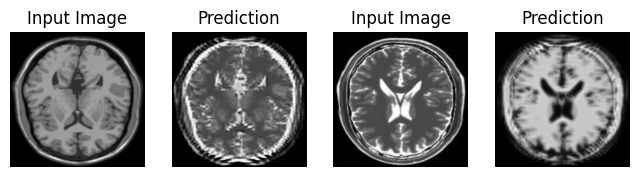

Checkpoint Saved at ./training_checkpoints/ckpt-26 for 26 EPOCH


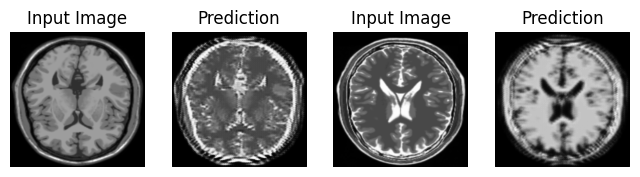

Checkpoint Saved at ./training_checkpoints/ckpt-27 for 27 EPOCH


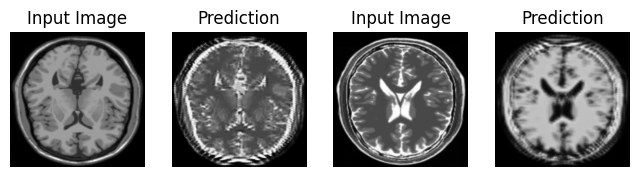

Checkpoint Saved at ./training_checkpoints/ckpt-28 for 28 EPOCH


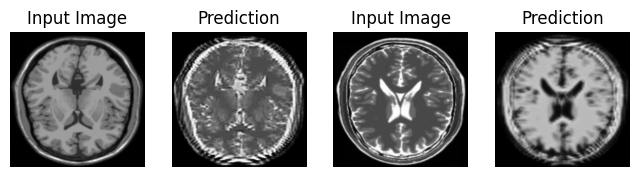

Checkpoint Saved at ./training_checkpoints/ckpt-29 for 29 EPOCH


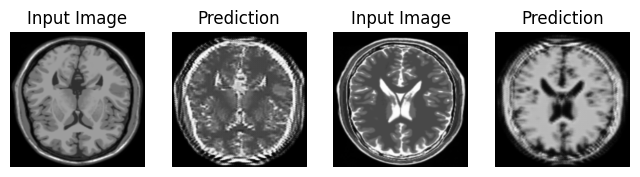

Checkpoint Saved at ./training_checkpoints/ckpt-30 for 30 EPOCH


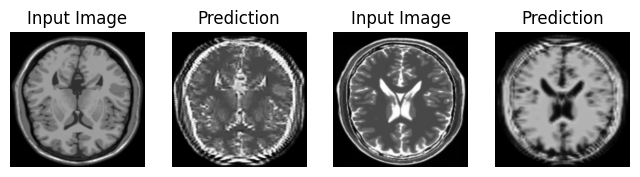

Checkpoint Saved at ./training_checkpoints/ckpt-31 for 31 EPOCH


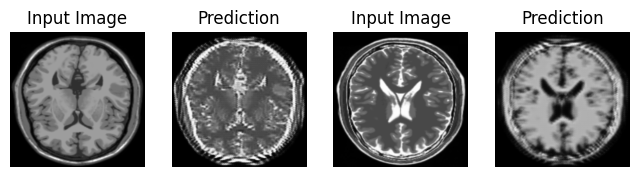

Checkpoint Saved at ./training_checkpoints/ckpt-32 for 32 EPOCH


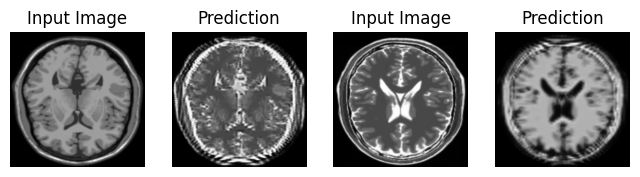

Checkpoint Saved at ./training_checkpoints/ckpt-33 for 33 EPOCH


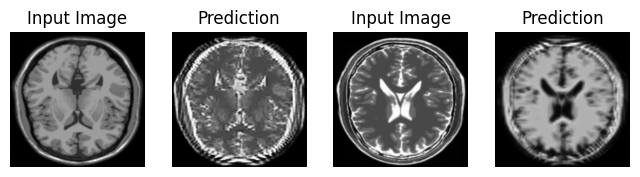

Checkpoint Saved at ./training_checkpoints/ckpt-34 for 34 EPOCH


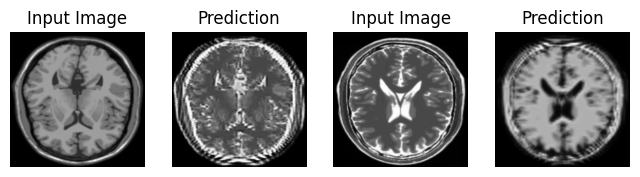

Checkpoint Saved at ./training_checkpoints/ckpt-35 for 35 EPOCH


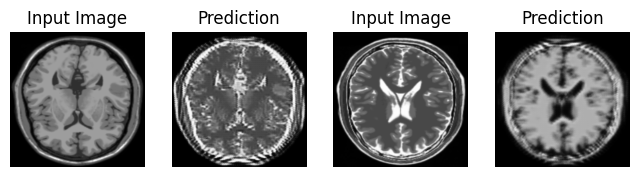

Checkpoint Saved at ./training_checkpoints/ckpt-36 for 36 EPOCH


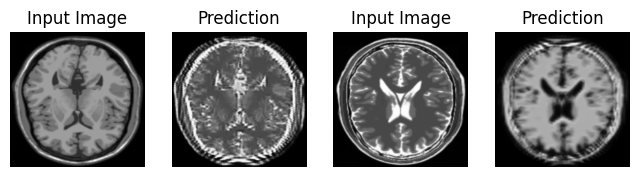

Checkpoint Saved at ./training_checkpoints/ckpt-37 for 37 EPOCH


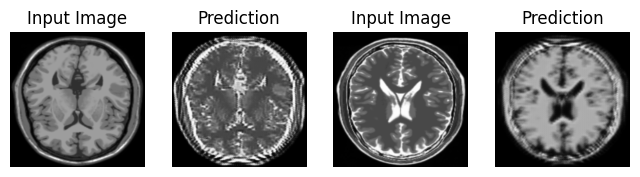

Checkpoint Saved at ./training_checkpoints/ckpt-38 for 38 EPOCH


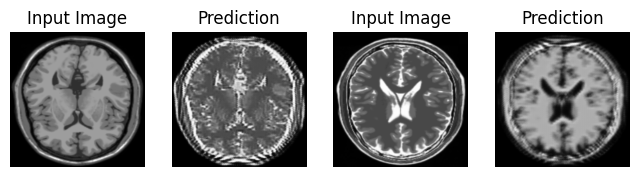

Checkpoint Saved at ./training_checkpoints/ckpt-39 for 39 EPOCH


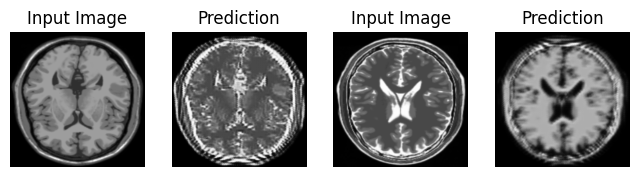

Checkpoint Saved at ./training_checkpoints/ckpt-40 for 40 EPOCH


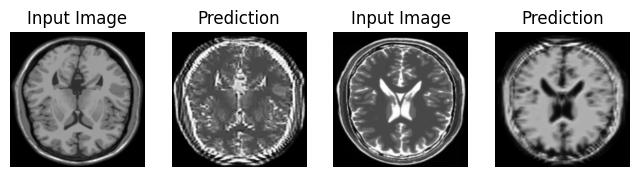

Checkpoint Saved at ./training_checkpoints/ckpt-41 for 41 EPOCH


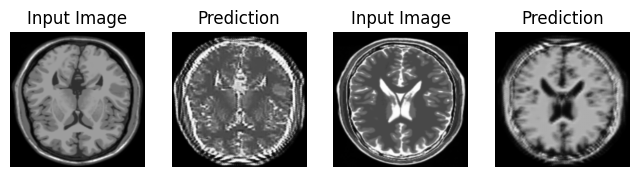

Checkpoint Saved at ./training_checkpoints/ckpt-42 for 42 EPOCH


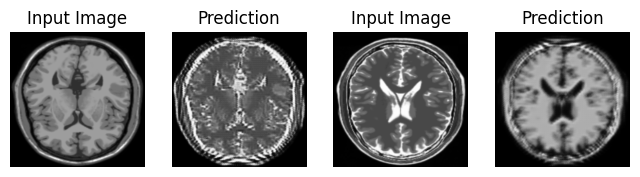

Checkpoint Saved at ./training_checkpoints/ckpt-43 for 43 EPOCH


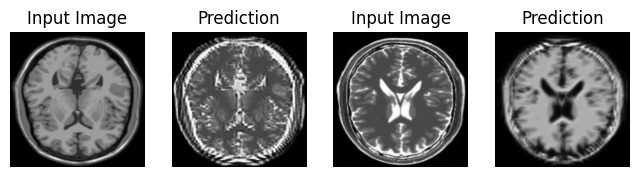

Checkpoint Saved at ./training_checkpoints/ckpt-44 for 44 EPOCH


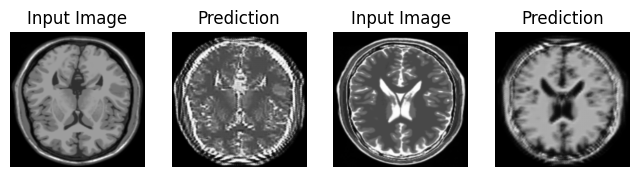

Checkpoint Saved at ./training_checkpoints/ckpt-45 for 45 EPOCH


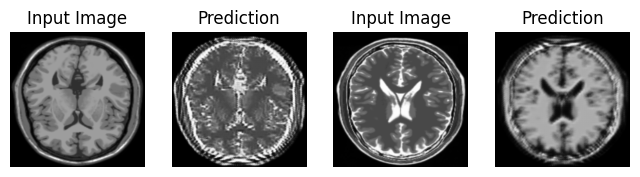

Checkpoint Saved at ./training_checkpoints/ckpt-46 for 46 EPOCH


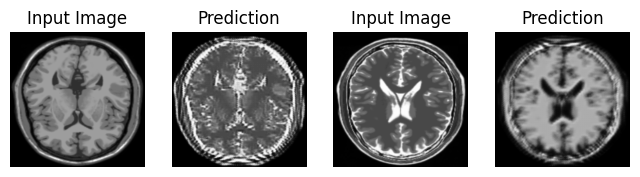

Checkpoint Saved at ./training_checkpoints/ckpt-47 for 47 EPOCH


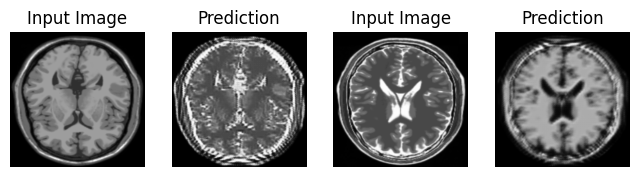

Checkpoint Saved at ./training_checkpoints/ckpt-48 for 48 EPOCH


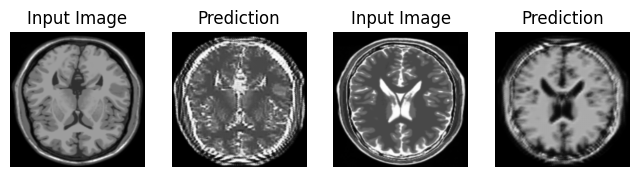

Checkpoint Saved at ./training_checkpoints/ckpt-49 for 49 EPOCH


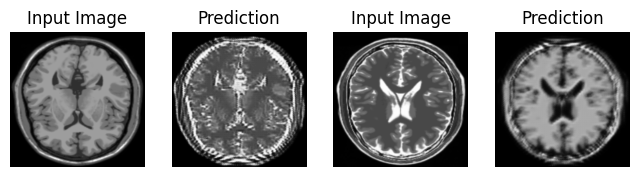

Checkpoint Saved at ./training_checkpoints/ckpt-50 for 50 EPOCH


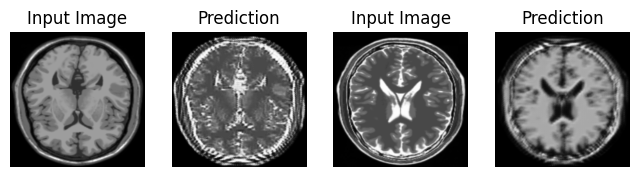

Checkpoint Saved at ./training_checkpoints/ckpt-51 for 51 EPOCH


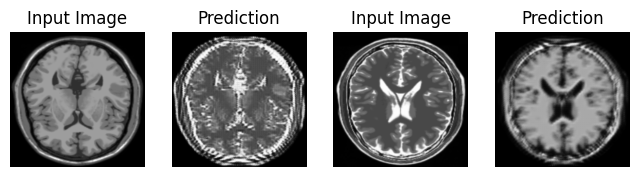

Checkpoint Saved at ./training_checkpoints/ckpt-52 for 52 EPOCH


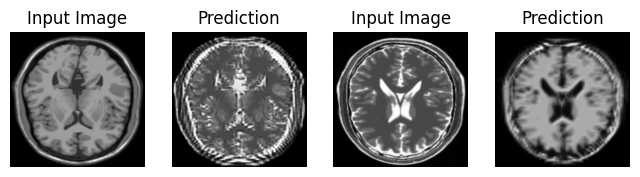

Checkpoint Saved at ./training_checkpoints/ckpt-53 for 53 EPOCH


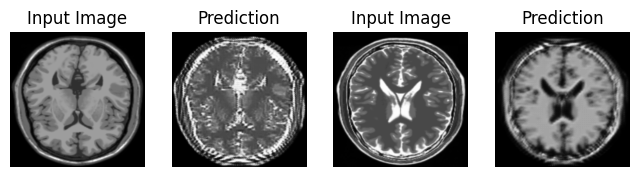

Checkpoint Saved at ./training_checkpoints/ckpt-54 for 54 EPOCH


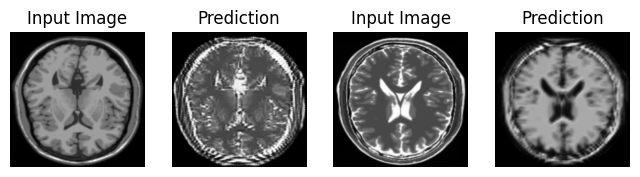

Checkpoint Saved at ./training_checkpoints/ckpt-55 for 55 EPOCH


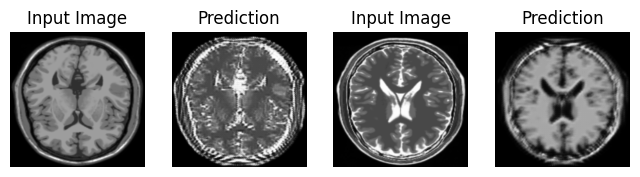

Checkpoint Saved at ./training_checkpoints/ckpt-56 for 56 EPOCH


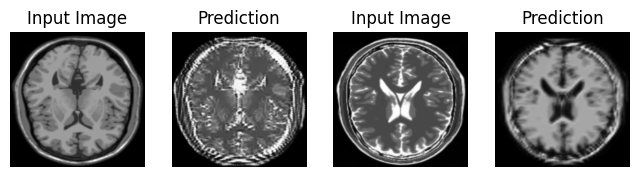

Checkpoint Saved at ./training_checkpoints/ckpt-57 for 57 EPOCH


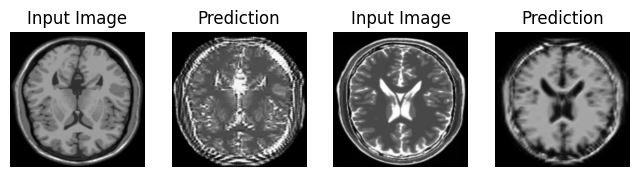

Checkpoint Saved at ./training_checkpoints/ckpt-58 for 58 EPOCH


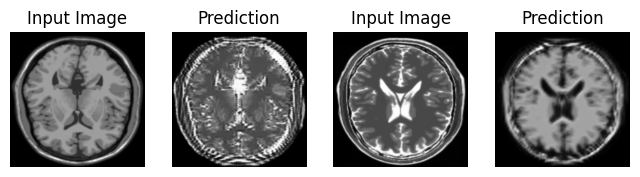

Checkpoint Saved at ./training_checkpoints/ckpt-59 for 59 EPOCH


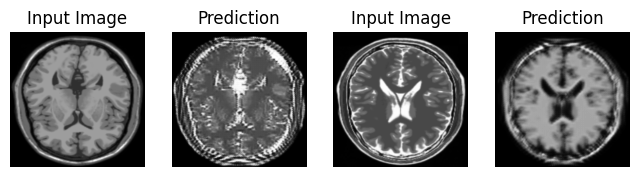

Checkpoint Saved at ./training_checkpoints/ckpt-60 for 60 EPOCH


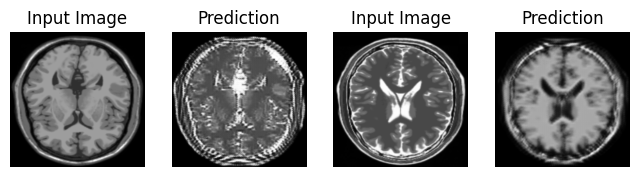

Checkpoint Saved at ./training_checkpoints/ckpt-61 for 61 EPOCH


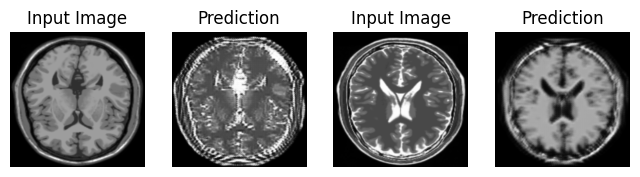

Checkpoint Saved at ./training_checkpoints/ckpt-62 for 62 EPOCH


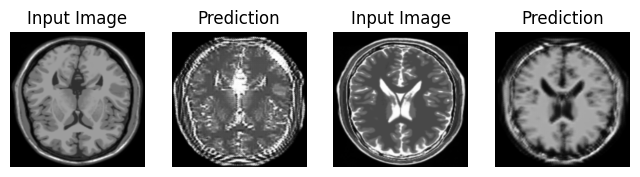

Checkpoint Saved at ./training_checkpoints/ckpt-63 for 63 EPOCH


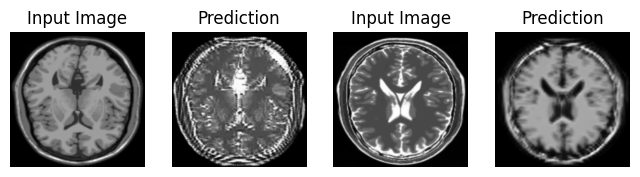

Checkpoint Saved at ./training_checkpoints/ckpt-64 for 64 EPOCH


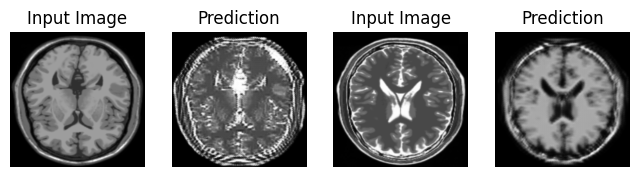

Checkpoint Saved at ./training_checkpoints/ckpt-65 for 65 EPOCH


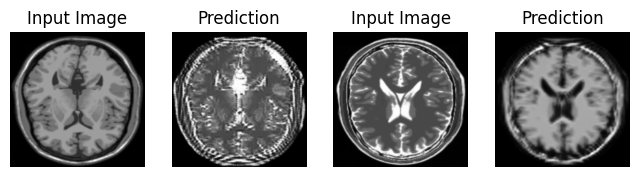

Checkpoint Saved at ./training_checkpoints/ckpt-66 for 66 EPOCH


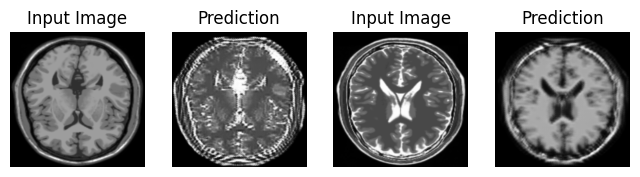

Checkpoint Saved at ./training_checkpoints/ckpt-67 for 67 EPOCH


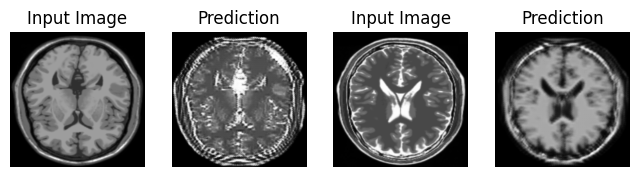

Checkpoint Saved at ./training_checkpoints/ckpt-68 for 68 EPOCH


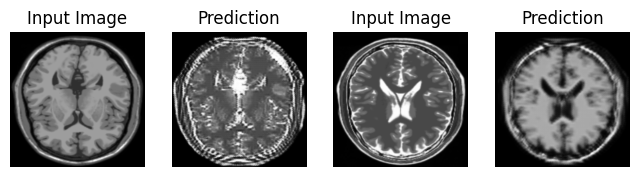

Checkpoint Saved at ./training_checkpoints/ckpt-69 for 69 EPOCH


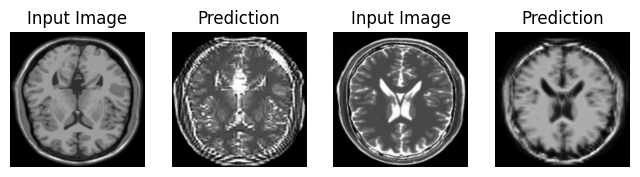

Checkpoint Saved at ./training_checkpoints/ckpt-70 for 70 EPOCH


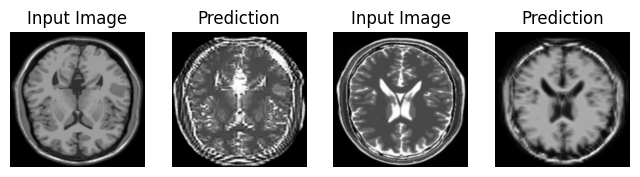

Checkpoint Saved at ./training_checkpoints/ckpt-71 for 71 EPOCH


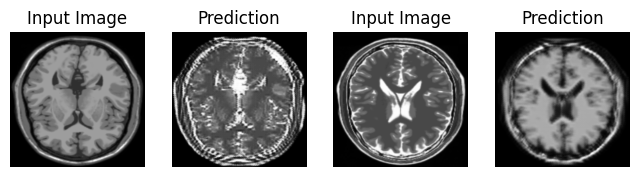

Checkpoint Saved at ./training_checkpoints/ckpt-72 for 72 EPOCH


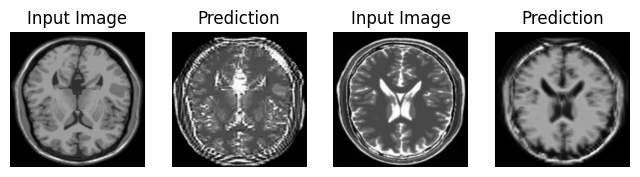

Checkpoint Saved at ./training_checkpoints/ckpt-73 for 73 EPOCH


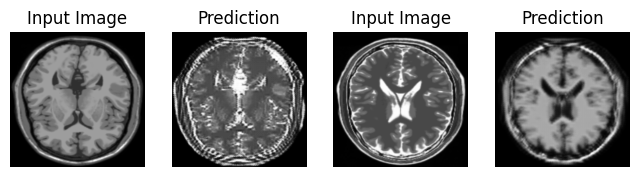

Checkpoint Saved at ./training_checkpoints/ckpt-74 for 74 EPOCH


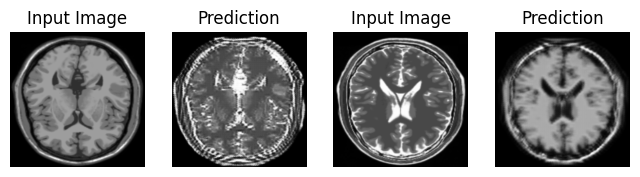

Checkpoint Saved at ./training_checkpoints/ckpt-75 for 75 EPOCH


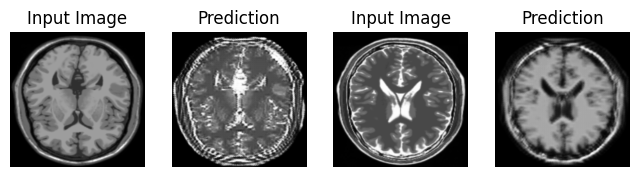

Checkpoint Saved at ./training_checkpoints/ckpt-76 for 76 EPOCH


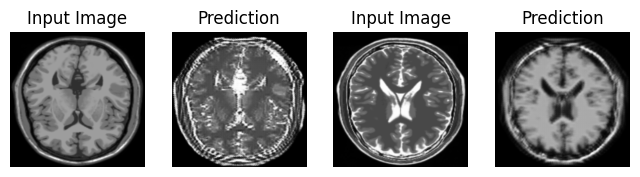

Checkpoint Saved at ./training_checkpoints/ckpt-77 for 77 EPOCH


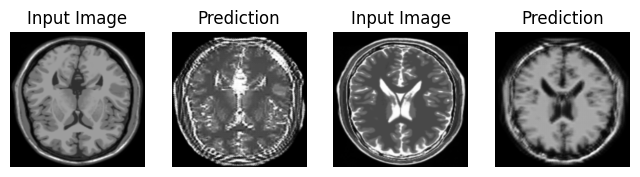

Checkpoint Saved at ./training_checkpoints/ckpt-78 for 78 EPOCH


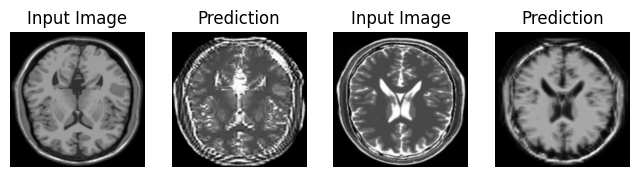

Checkpoint Saved at ./training_checkpoints/ckpt-79 for 79 EPOCH


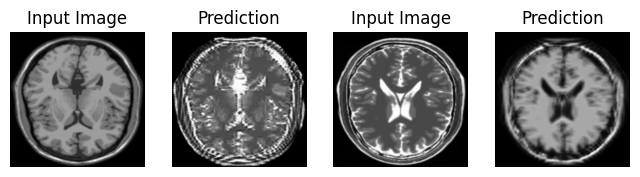

Checkpoint Saved at ./training_checkpoints/ckpt-80 for 80 EPOCH


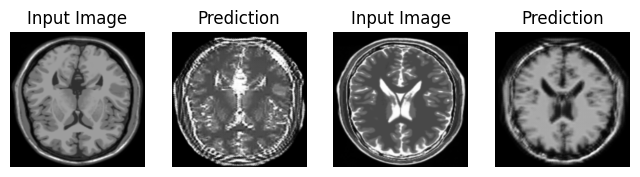

Checkpoint Saved at ./training_checkpoints/ckpt-81 for 81 EPOCH


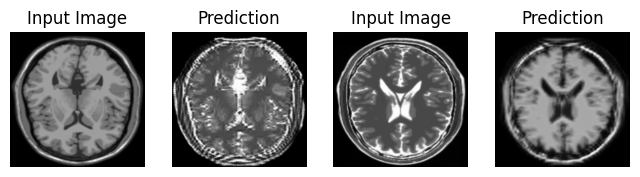

Checkpoint Saved at ./training_checkpoints/ckpt-82 for 82 EPOCH


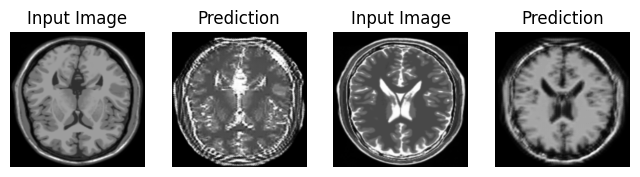

Checkpoint Saved at ./training_checkpoints/ckpt-83 for 83 EPOCH


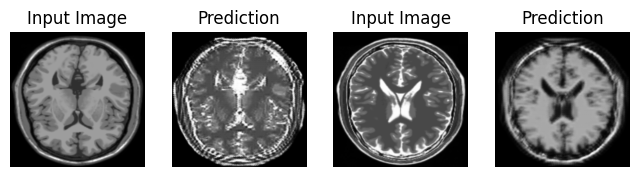

Checkpoint Saved at ./training_checkpoints/ckpt-84 for 84 EPOCH


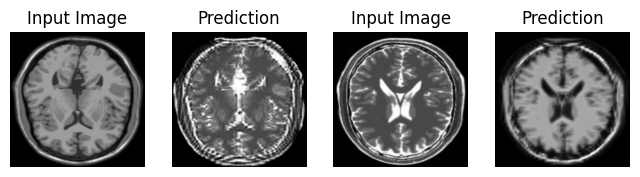

Checkpoint Saved at ./training_checkpoints/ckpt-85 for 85 EPOCH


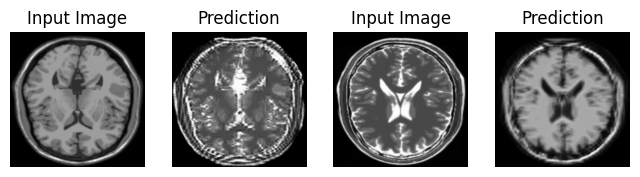

Checkpoint Saved at ./training_checkpoints/ckpt-86 for 86 EPOCH


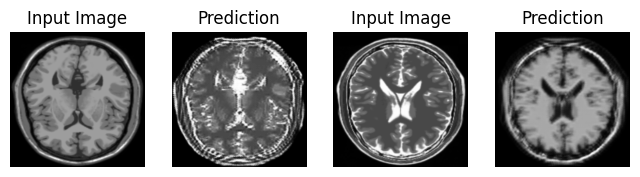

Checkpoint Saved at ./training_checkpoints/ckpt-87 for 87 EPOCH


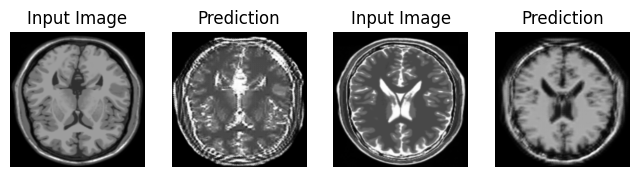

Checkpoint Saved at ./training_checkpoints/ckpt-88 for 88 EPOCH


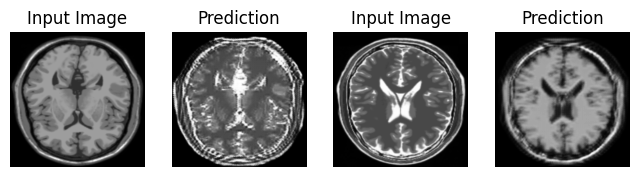

Checkpoint Saved at ./training_checkpoints/ckpt-89 for 89 EPOCH


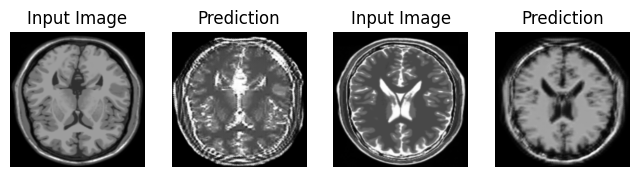

Checkpoint Saved at ./training_checkpoints/ckpt-90 for 90 EPOCH


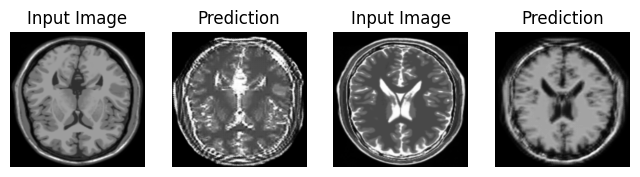

Checkpoint Saved at ./training_checkpoints/ckpt-91 for 91 EPOCH


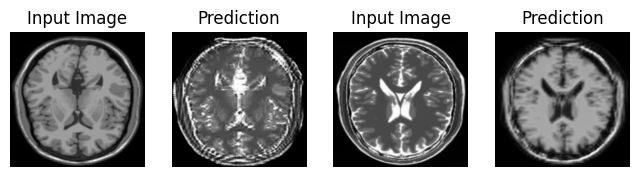

Checkpoint Saved at ./training_checkpoints/ckpt-92 for 92 EPOCH


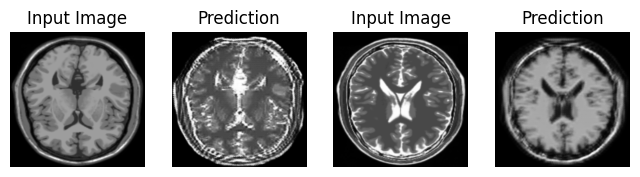

Checkpoint Saved at ./training_checkpoints/ckpt-93 for 93 EPOCH


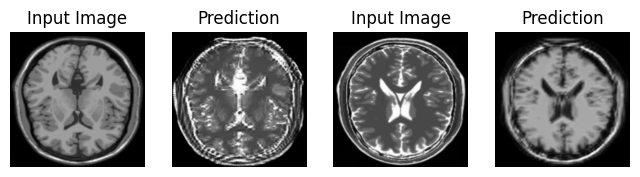

Checkpoint Saved at ./training_checkpoints/ckpt-94 for 94 EPOCH


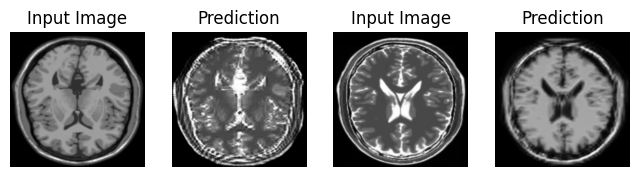

Checkpoint Saved at ./training_checkpoints/ckpt-95 for 95 EPOCH


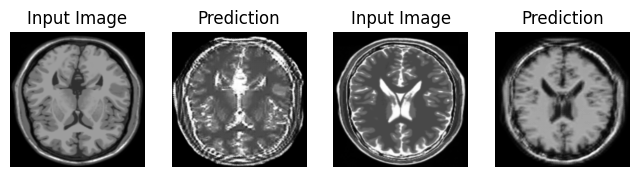

Checkpoint Saved at ./training_checkpoints/ckpt-96 for 96 EPOCH


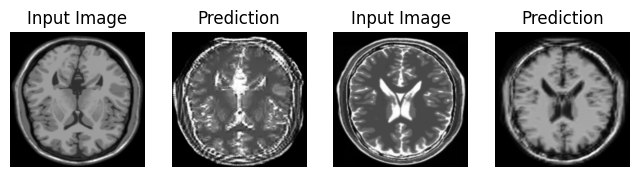

Checkpoint Saved at ./training_checkpoints/ckpt-97 for 97 EPOCH


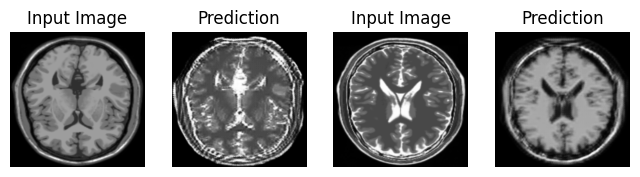

Checkpoint Saved at ./training_checkpoints/ckpt-98 for 98 EPOCH


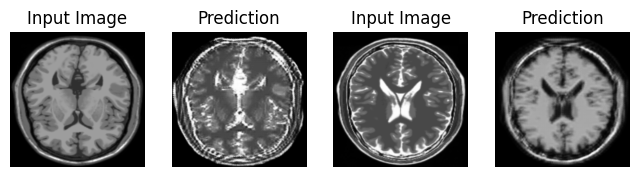

Checkpoint Saved at ./training_checkpoints/ckpt-99 for 99 EPOCH


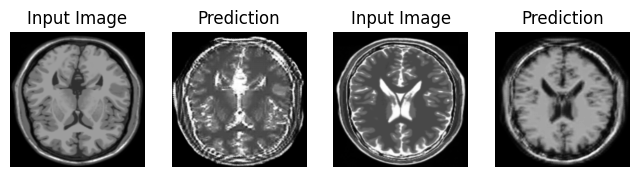

Checkpoint Saved at ./training_checkpoints/ckpt-100 for 100 EPOCH


In [ ]:
# Model training
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((type1_data, type2_data)):
        train_step(image_x, image_y)
    generated_image(generator_g, type1_sample_image, generator_f, type2_sample_image, epoch)
    chk_save_path = chk_manager.save()
    print('Checkpoint Saved at {0} for {1} EPOCH'.format(chk_save_path, epoch))

### Generating GIF for results

In [ ]:
# Defining the GIF file parameters
animation = 'cycle_GAN.gif'
with imageio.get_writer(animation, mode='I') as writer:
    filenames = glob.glob('image*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)


<ipython-input-43-cf790a0556cb>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


In [ ]:
# Downloading tensorflow docs module
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-_qxn68u1
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-_qxn68u1
  Resolved https://github.com/tensorflow/docs to commit 42550ed44d5bfa9f372bc5ee7fb86b8953832e9e
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2024.2.5.73858-py3-none-any.whl size=182442 sha256=6dfe781d372d5be51db8035e1ce7d275c162d8bcdf7a5d208fe21816bf14877b
  Stored in directory: /tmp/pip-ephem-wheel-cache-qn2yhcvf/wheels/86/0f/1e/3b62293c8ffd0fd5a49508e6871cdb7554abe9c62afd35ec53
Successfully built tensorflow-docs



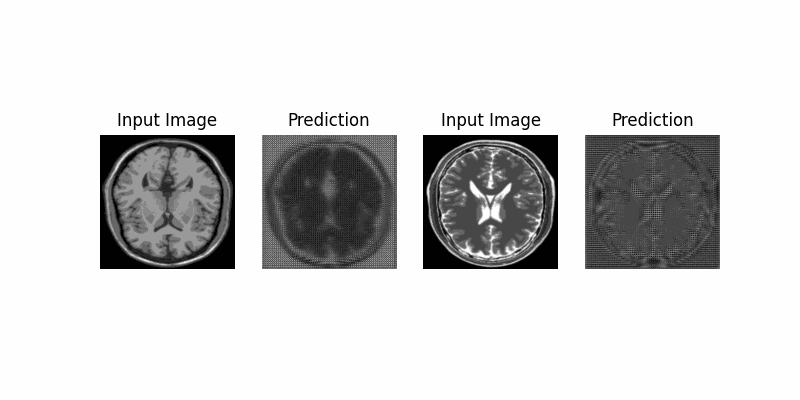

In [ ]:
# Creating GIF from the training images
import tensorflow_docs.vis.embed as embed
embed.embed_file(animation)